# Week 2

In [1]:
# Own Libraries
from utils.plotting import plot_image_and_similar
from utils.data import DataManager
from utils.metrics import prec_recall, iou_score, f1_dice
from utils.similarity import Similarity
from utils.image_processing import image_to_windows, get_3d_norm_histogram, calculate_histograms,text_removal
from utils.segbackground import NMS, background_crop
# 3rd Party Libraries
from skimage.io import imread
from skimage.color import rgb2gray
from typing import Tuple, List
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import pickle
import ml_metrics as metrics

In [2]:
def readimg (path):
    return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

# Load Data

In [3]:
!ls data/

BBDD	 qsd1_w2  qsd2_w1  qsd2_w3  qst2_w1  readme
qsd1_w1  qsd1_w3  qsd2_w2  qst1_w2  qst2_w2


In [32]:
# Load Data
data_manager = DataManager()
db, db_files = data_manager.load_data(folder = "./data/BBDD/", extension = ".jpg", desc = "Loading BBDD Data...")

qsd1_w3, qsd1_w3_files = data_manager.load_data(folder = "./data/qsd1_w3/", extension = ".jpg", desc = "Loading qsd1_w3 Data...")
qsd2_w3, qsd2_w3_files = data_manager.load_data(folder = "./data/qsd2_w3/", extension = ".jpg", desc = "Loading qsd2_w3 Data...")

Loading BBDD Data...: 100%|████████████████████████████████████████| 287/287 [00:03<00:00, 76.16it/s]


./data/BBDD/ read: 287 images


Loading qsd1_w3 Data...: 100%|█████████████████████████████████████| 30/30 [00:00<00:00, 1223.89it/s]


./data/qsd1_w3/ read: 30 images


Loading qsd2_w3 Data...: 100%|██████████████████████████████████████| 30/30 [00:00<00:00, 224.52it/s]


./data/qsd2_w3/ read: 30 images


This week we use mainly:
- QSD1-W3 (30) / QST1-W3 (50)  cropped pictures with overlapping text (name of painter), one painting per image, some paintings with noise, some paintings with changes in color

- QSD2-W3 (30) / QST2-W3 (30)  pictures with background and text and in some cases more than one picture per image, some paintings with noise, some paintings with changes in color

In [33]:
qsd1_w3_files[:5]

('./data/qsd1_w3/00000.jpg',
 './data/qsd1_w3/00001.jpg',
 './data/qsd1_w3/00002.jpg',
 './data/qsd1_w3/00003.jpg',
 './data/qsd1_w3/00004.jpg')

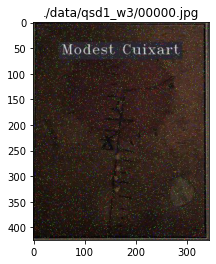

In [34]:
for img, filename in zip(qsd1_w3, qsd1_w3_files):
    plt.imshow(img)
    plt.title(filename)
    break # show only 1 image

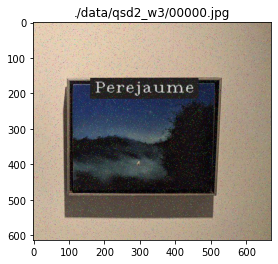

In [35]:
for img, filename in zip(qsd2_w3, qsd2_w3_files):
    plt.imshow(img)
    plt.title(filename)
    break # show only 1 image

## Preprocessing: Noise Reduction

## Step 1) Crop, background removal and obtain the pictures.

In [62]:
DO_BKGCROP = False

In [63]:
if DO_BKGCROP:
    qsd2_w3, qsd2_w3_files = background_crop (files= qsd2_w3_files, gt_masks= True, save_masks = False, plot_results=False)

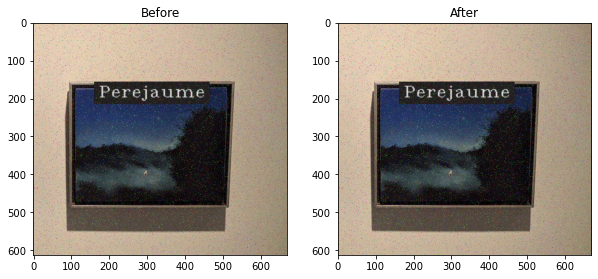

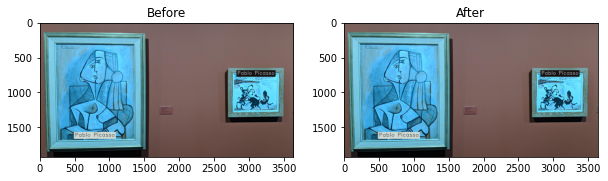

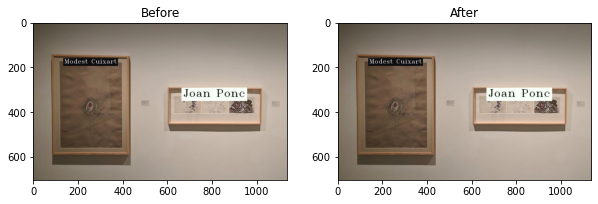

In [64]:
for img, filename in zip(qsd2_w3[:3], qsd2_w3_files[:3]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    plt.show()

## Step 2) Text Removal using crops

In [44]:
DO_TEXT_REMOVAL = True

In [45]:
#Method to remove text from the image with a rectangle 0 mask
if DO_TEXT_REMOVAL:
    qsd1_w3,contours = text_removal(qsd1_w3,num_images= 1,desc = 'Removing text of images') 
    #qsd2_w2,contours = text_removal(qsd2_w2,num_images= 1,desc = 'Removing text of images') 

Removing text of images: 100%|██████████████████████████████████████| 30/30 [00:00<00:00, 211.50it/s]
/home/nanashi/mastercv/m1/Team8/utils/image_processing.py:129: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(text_removed_image)


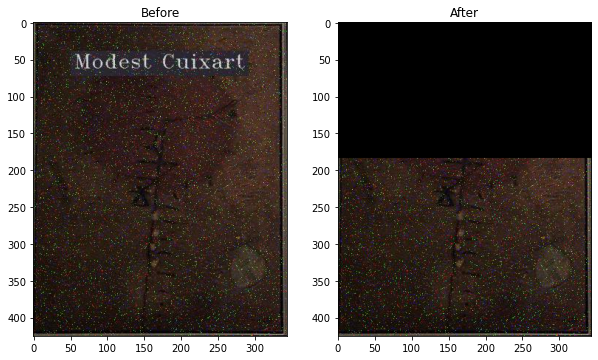

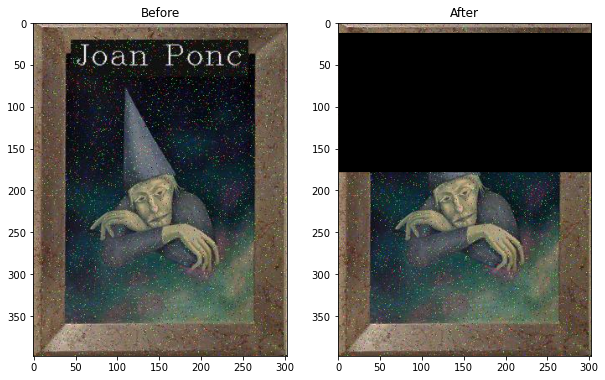

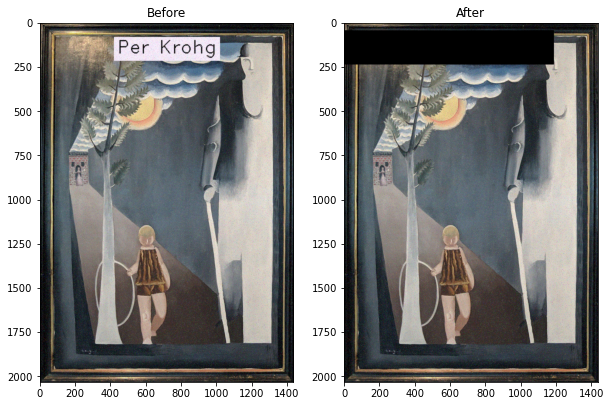

In [53]:
for img, filename in zip(qsd1_w3[:3], qsd1_w3_files[:3]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    plt.show()

## Step 3) Feature extraction

In [65]:
NBINS = 16
NCOLS = 8
NROWS = 8

In [66]:
# 3D Normalized Histograms Multiresolutio/Block Images
db_feature_matrix = calculate_histograms(data = db, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc="Normalized 3D Histograms Calculation for BBDD...")
qsd1_w3_feature_matrix = calculate_histograms(data = qsd1_w3, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qsd1_w3...")
qsd2_w3_feature_matrix = calculate_histograms(data = qsd2_w3, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qsd1_w3...")

Normalized 3D Histograms Calculation for BBDD...: 100%|███████████| 287/287 [00:01<00:00, 192.38it/s]
Normalized 3D Histograms Calculation for qsd1_w3...: 100%|██████████| 30/30 [00:00<00:00, 525.45it/s]
Normalized 3D Histograms Calculation for qsd1_w3...: 100%|██████████| 30/30 [00:00<00:00, 175.51it/s]


In [67]:
print (f'For each of the {qsd1_w3_feature_matrix.shape[0]} images, we have a {qsd1_w3_feature_matrix.shape[1]} dimensional descriptor')

For each of the 30 images, we have a 262144 dimensional descriptor


In [68]:
# Similarity
sim = Similarity()
qs1_w3_similarities  = sim.compute_similarities(qs = qsd1_w3_feature_matrix, db_feature_matrix = db_feature_matrix, desc = "Computing qsd1_w3 similarities...", similarity = 'hellinger')
qs2_w3_similarities  = sim.compute_similarities(qs = qsd2_w3_feature_matrix, db_feature_matrix = db_feature_matrix, desc = "Computing qsd1_w3 similarities...", similarity = 'hellinger')

Computing qsd1_w3 similarities...: 100%|█████████████████████████████| 30/30 [00:01<00:00, 20.84it/s]


In [69]:
# Get top K
K = 10

top_k_qsd1_w3 = sim.get_top_k(similarity_matrix = qs1_w3_similarities, db_files = db_files, k=K, desc="Retrieving qsd2_w1 top K similar images...")
top_k_qsd2_w3 = sim.get_top_k(similarity_matrix = qs2_w3_similarities, db_files = db_files, k=K, desc="Retrieving qsd2_w1 top K similar images...")

Retrieving qsd2_w1 top K similar images...: 100%|█████████████████| 30/30 [00:00<00:00, 51316.93it/s]


### Validation Scores

In [73]:
SAVE_RESULTS = False
K = 10

predicted_results = data_manager.save_results_1(results = top_k_qsd1_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd1_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

predicted_results = data_manager.save_results_1(results = top_k_qsd2_w3, path = "./week3/QST1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
expected_results = pickle.load(file = open('./data/qsd2_w3/gt_corresps.pkl', "rb"))
metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
print("MAP@{} Score: {:.4f}% ({}/{})".format(K, metric*100,int(len(predicted_results)*metric),len(predicted_results)))

MAP@10 Score: 78.2540% (23/30)
MAP@10 Score: 31.9444% (9/30)


In [74]:
top_k_qsd2_w3[0]

['./data/BBDD/bbdd_00220.jpg',
 './data/BBDD/bbdd_00085.jpg',
 './data/BBDD/bbdd_00023.jpg',
 './data/BBDD/bbdd_00212.jpg',
 './data/BBDD/bbdd_00010.jpg',
 './data/BBDD/bbdd_00073.jpg',
 './data/BBDD/bbdd_00191.jpg',
 './data/BBDD/bbdd_00117.jpg',
 './data/BBDD/bbdd_00197.jpg',
 './data/BBDD/bbdd_00178.jpg']

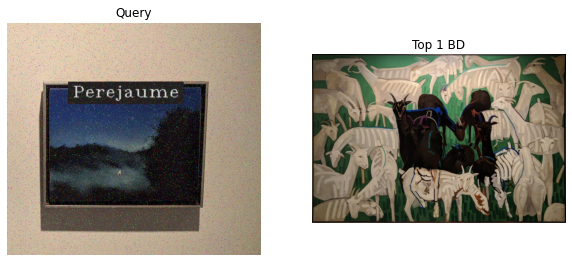

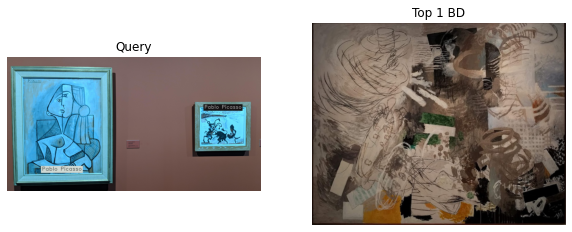

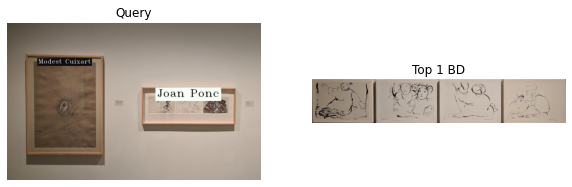

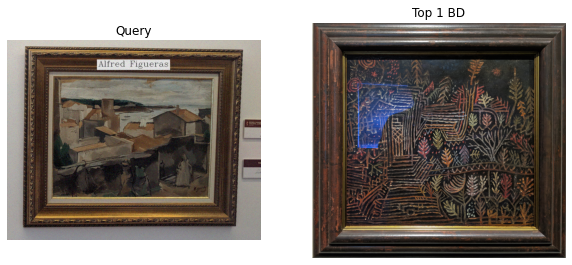

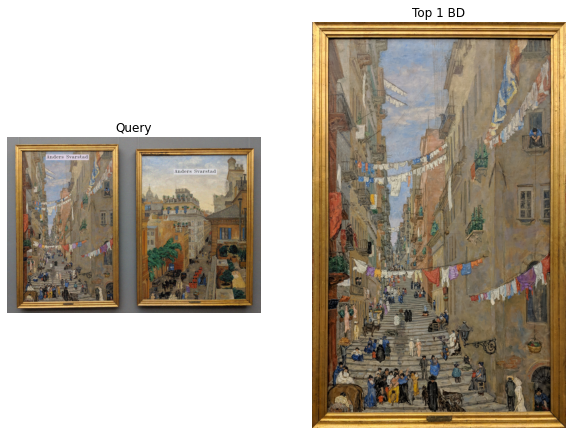

...

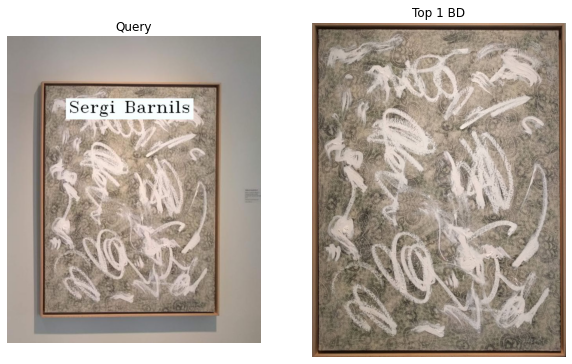

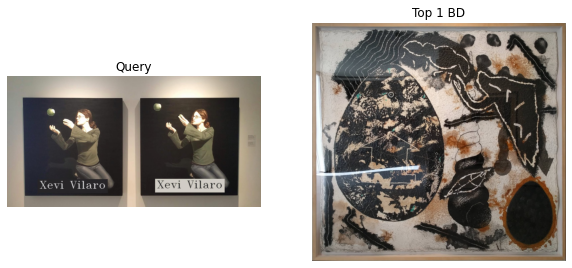

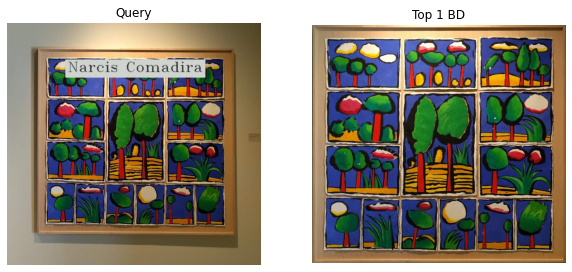

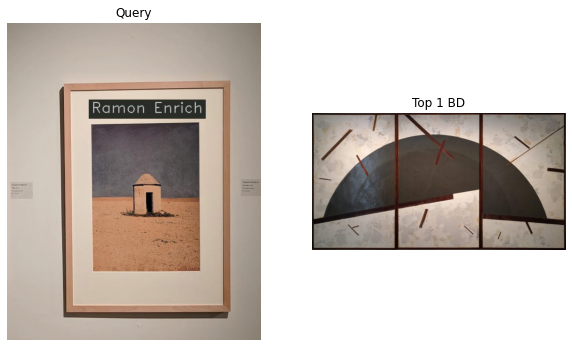

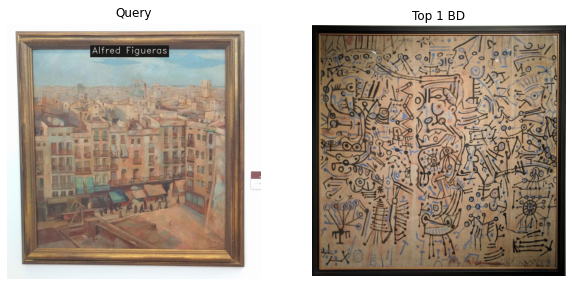

In [75]:
plot_image_and_similar(qsd2_w3,top_k_qsd2_w3, topk=1)